In [1]:
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import seaborn as sns
import pandas as pd
import numpy as np
import tensorflow as tf

from utils import *
from tensorflow.keras.layers import *

# Preparing the numeric Data

In [2]:
data = pd.read_csv('./dataset/data-final-1.csv', infer_datetime_format=True, header=0, index_col='datetime')

C:\Users\Bintang\AppData\Local\Temp\ipykernel_17928\3605832206.py:1: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  data = pd.read_csv('./dataset/data-final-1.csv', infer_datetime_format=True, header=0, index_col='datetime')


In [3]:
data.columns

Index(['Temperature', 'Humidity', 'Illumination', 'kat_temperature',
       'kat_humidity', 'kat_illumination', 'Kipas', 'Humidifier', 'LED'],
      dtype='object')

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8866 entries, 03/07/2023 0:00:00 to 10/07/2023 23:16:00
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Temperature       8866 non-null   float64
 1   Humidity          8866 non-null   int64  
 2   Illumination      8866 non-null   float64
 3   kat_temperature   8866 non-null   int64  
 4   kat_humidity      8866 non-null   int64  
 5   kat_illumination  8866 non-null   int64  
 6   Kipas             8866 non-null   int64  
 7   Humidifier        8866 non-null   int64  
 8   LED               8866 non-null   int64  
dtypes: float64(2), int64(7)
memory usage: 692.7+ KB


In [5]:
data = data[[col for col in data.columns if not col.startswith('kat_')]]

In [6]:
stats = data.describe()
stats.pop('Kipas')
stats.pop('LED') 
stats.pop('Humidifier')
stats = stats.transpose()
stats

,count,mean,std,min,25%,50%,75%,max
Temperature,8866.0,29.948850,1.032873,27.6,28.90,30.20,30.80,32.80
Humidity,8866.0,66.783555,4.345455,54.0,64.00,67.00,70.00,76.00
Illumination,8866.0,73.429239,1.497201,69.6,72.82,73.24,73.65,80.59


In [7]:
train, test = train_test_split(data, test_size=.2, random_state=1)

In [8]:
y_train_fan, y_train_humid, y_train_led = format_output(train)
y_test_fan, y_test_humid, y_test_led = format_output(test)

In [9]:
x_train = norm_data(train, stats)
x_test = norm_data(test, stats)

x_train = x_train.to_numpy()
x_test = x_test.to_numpy()

In [10]:
type(x_train)

numpy.ndarray

In [11]:
print("Shape of x_train before reshaping:", x_train.shape)
print("Shape of x_test before reshaping:", x_test.shape)

# Reshape the data to be 3D for LSTM input
x_train = x_train.reshape((x_train.shape[0], 1, x_train.shape[1]))
x_test = x_test.reshape((x_test.shape[0], 1, x_test.shape[1]))

# Check the shape after reshaping
print("Shape of x_train after reshaping:", x_train.shape)
print("Shape of x_test after reshaping:", x_test.shape)


Shape of x_train before reshaping: (7092, 3)
Shape of x_test before reshaping: (1774, 3)
Shape of x_train after reshaping: (7092, 1, 3)
Shape of x_test after reshaping: (1774, 1, 3)


# Preparing the Images Data

In [12]:
import os

In [13]:
img_path = os.path.join('dataset', 'imgs')
img_path

'dataset\\imgs'

In [14]:
classes = [x for x in os.listdir(img_path)]
classes

['hama', 'normal', 'penyakit']

In [15]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.,
    validation_split=.2,
)

In [16]:
train_data = data_generator.flow_from_directory(
    img_path,
    target_size=(128, 128),
    batch_size=bs,
    color_mode='rgb',
    classes=classes,
    class_mode='sparse',
    subset='training'
)

data_val = data_generator.flow_from_directory(
    img_path,
    target_size=(128, 128),
    batch_size=bs,
    color_mode='rgb',
    classes=classes,
    class_mode='sparse',
    subset='validation'
)

Found 240 images belonging to 3 classes.
Found 60 images belonging to 3 classes.


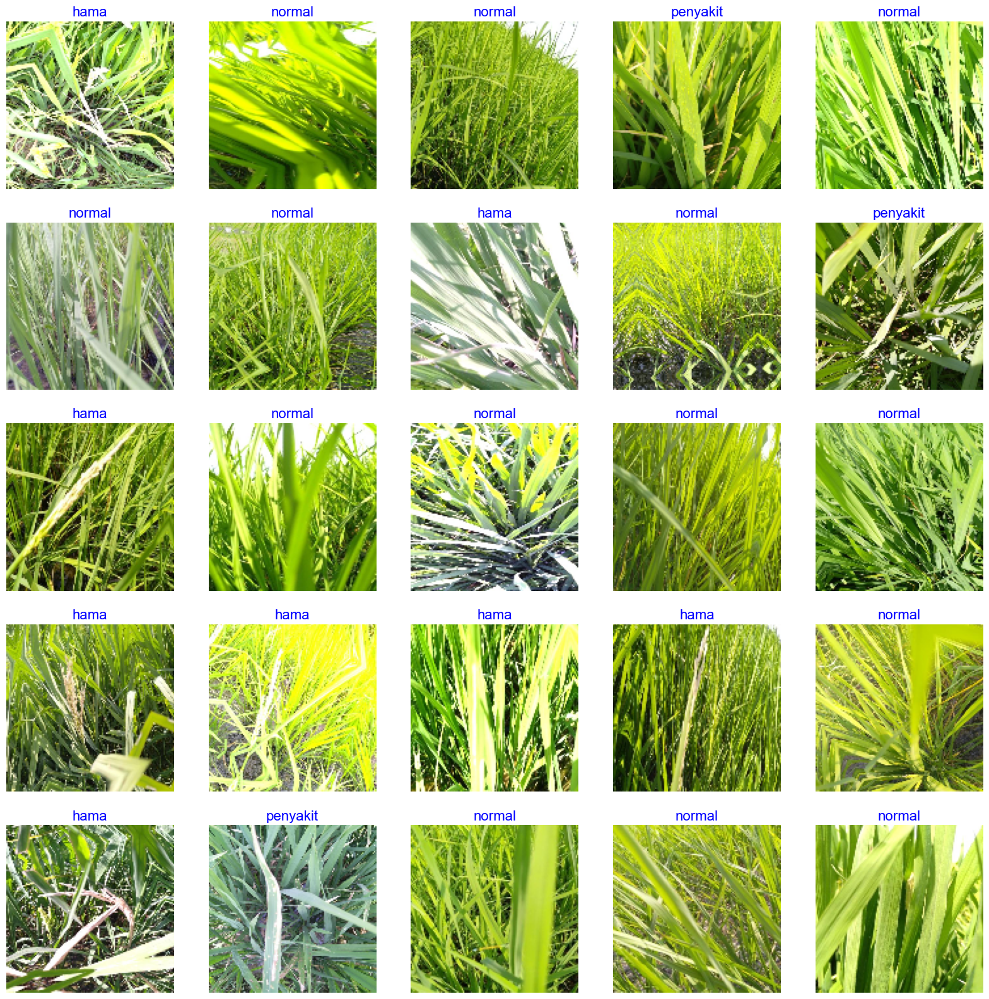

In [17]:
show_image_samples(train_data, classes)

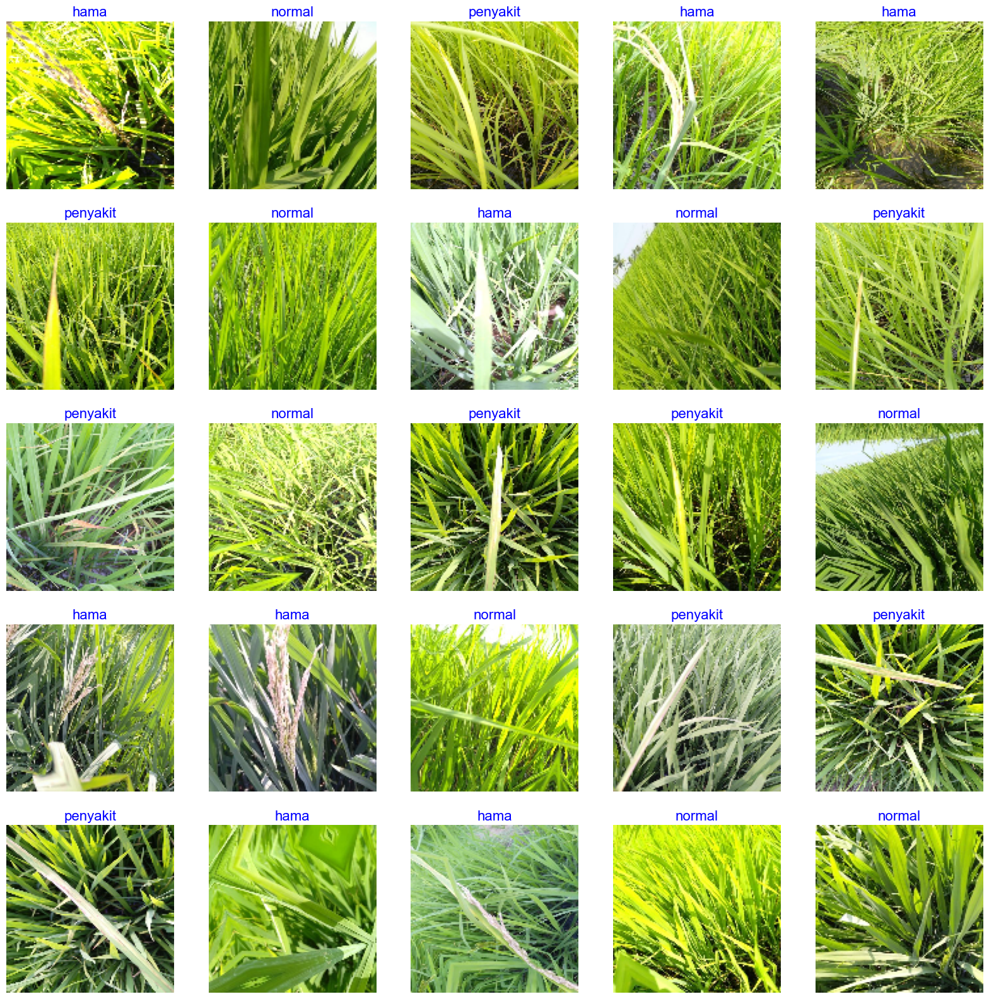

In [18]:
show_image_samples(data_val, classes)

# Create the models

In [19]:
def img_base_model(input_layer):
    base_model = tf.keras.applications.VGG19(include_top=False, weights='imagenet', input_shape=(128, 128, 3))
    for layer in base_model.layers:
        layer.trainable = False
    x = base_model(input_layer)
    x = Flatten()(x)
    return x

def num_base_model(input_layer):
    x = Conv1D(32, 5, padding='causal', activation='relu')(input_layer)
    x = LSTM(64, return_sequences=True)(x)
    x = LSTM(64, return_sequences=True)(x)
    x = Flatten()(x)
    return x

def shared_dense_layers(input_layer):
    x = Dense(512, activation='relu')(input_layer)
    return x



In [20]:
img_input = Input(shape=(128, 128, 3), name='img_input')
num_input = tf.keras.layers.Input(shape=(x_train.shape[1], x_test.shape[2]), name='num_input')

img_features = img_base_model(img_input)
num_features = num_base_model(num_input)

combined_features = Concatenate()([img_features, num_features])
shared_features = shared_dense_layers(combined_features)


In [21]:
img_output = Dense(len(classes), activation='softmax', name='img_output')(shared_features)
fan_output = Dense(1, activation='sigmoid', name='fan_output')(shared_features)
led_output = Dense(1, activation='sigmoid', name='led_output')(shared_features)
humid_output = Dense(1, activation='sigmoid', name='humid_output')(shared_features)

model = tf.keras.models.Model(inputs=[img_input, num_input], outputs=[img_output, fan_output, led_output, humid_output])

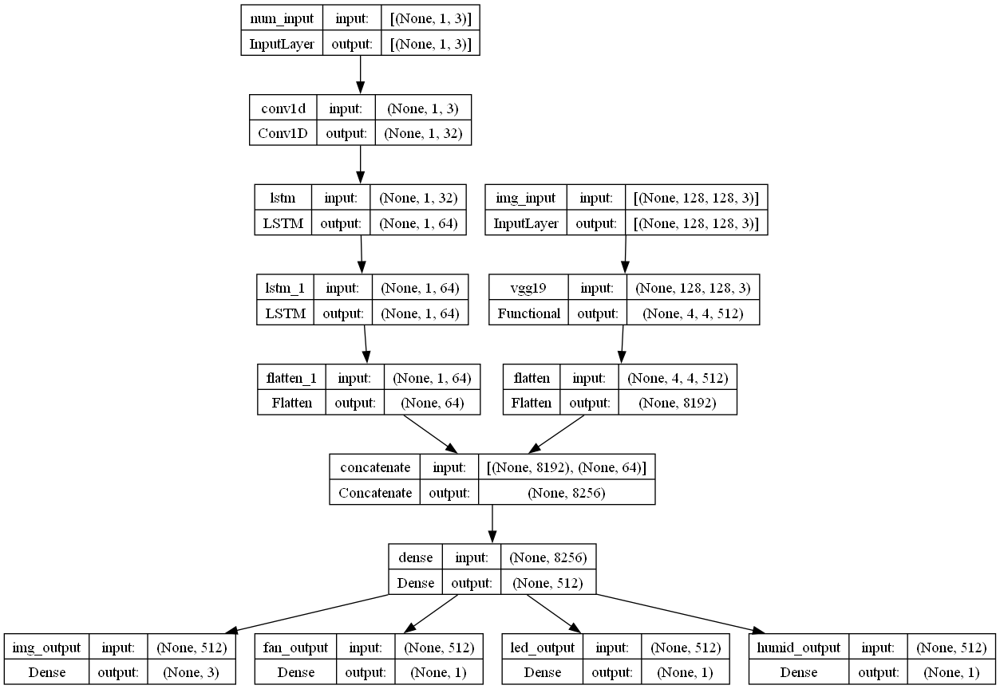

In [22]:
print_model(model, tf)

In [23]:
opt = tf.keras.optimizers.SGD(learning_rate=.0001, momentum=.9)
model.compile(optimizer=opt, 
              loss={'img_output': 'sparse_categorical_crossentropy', 
                    'fan_output': 'binary_crossentropy', 
                    'led_output': 'binary_crossentropy', 
                    'humid_output': 'binary_crossentropy'},
              metrics={'img_output': 'accuracy', 
                       'fan_output': 'accuracy', 
                       'led_output': 'accuracy', 
                       'humid_output': 'accuracy'})

# Combining Dataset

In [24]:
def combined_generator(image_gen, time_series_data, y_fan, y_led, y_humid):
    while True:
        img_data, img_labels = next(image_gen)
        batch_size = img_data.shape[0]
        batch_indices = np.random.randint(0, time_series_data.shape[0], batch_size)
        num_data = time_series_data[batch_indices]
        y_fan_batch = y_fan[batch_indices]
        y_led_batch = y_led[batch_indices]
        y_humid_batch = y_humid[batch_indices]
        yield [img_data, num_data], {'img_output': img_labels, 'fan_output': y_fan_batch, 'led_output': y_led_batch, 'humid_output': y_humid_batch}

train_gen = combined_generator(train_data, x_train, y_train_fan, y_train_led, y_train_humid)
val_gen = combined_generator(data_val, x_test, y_test_fan, y_test_led, y_test_humid)


In [25]:
history = model.fit(
    train_gen,
    validation_data=val_gen,
    steps_per_epoch=len(train_data),
    validation_steps=len(data_val),
    epochs=10,
    verbose=2
)

Epoch 1/10
8/8 - 11s - loss: 2.7662 - img_output_loss: 1.3456 - fan_output_loss: 0.2143 - led_output_loss: 0.5628 - humid_output_loss: 0.6435 - img_output_accuracy: 0.3375 - fan_output_accuracy: 0.9958 - led_output_accuracy: 0.7458 - humid_output_accuracy: 0.6542 - val_loss: 2.2155 - val_img_output_loss: 1.1141 - val_fan_output_loss: 0.1106 - val_led_output_loss: 0.4335 - val_humid_output_loss: 0.5573 - val_img_output_accuracy: 0.2500 - val_fan_output_accuracy: 1.0000 - val_led_output_accuracy: 0.8500 - val_humid_output_accuracy: 0.7667 - 11s/epoch - 1s/step
Epoch 2/10
8/8 - 1s - loss: 2.3546 - img_output_loss: 1.2065 - fan_output_loss: 0.0771 - led_output_loss: 0.5567 - humid_output_loss: 0.5143 - img_output_accuracy: 0.3167 - fan_output_accuracy: 0.9958 - led_output_accuracy: 0.7833 - humid_output_accuracy: 0.7958 - val_loss: 2.5655 - val_img_output_loss: 1.1627 - val_fan_output_loss: 0.0254 - val_led_output_loss: 0.6421 - val_humid_output_loss: 0.7353 - val_img_output_accuracy: 0.35

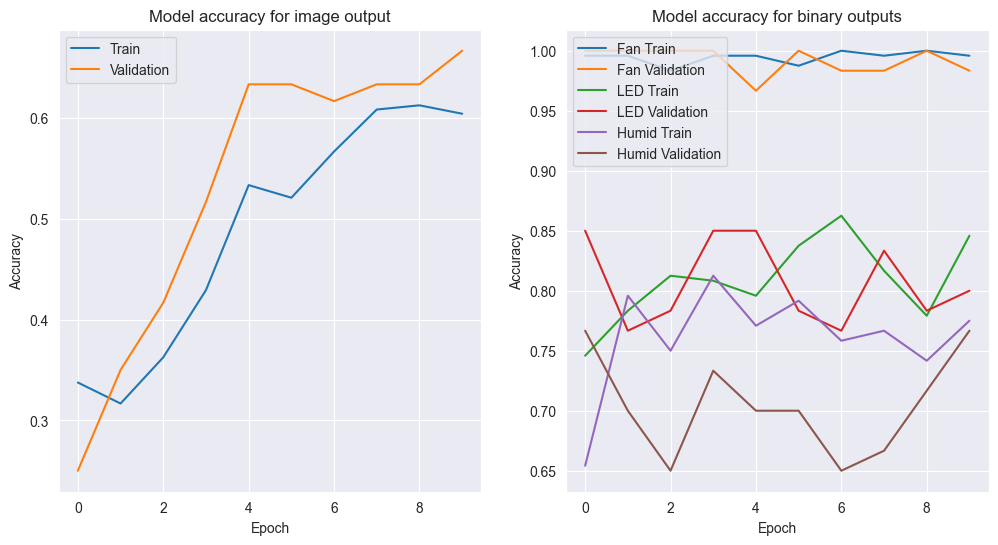

In [26]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['img_output_accuracy'])
plt.plot(history.history['val_img_output_accuracy'])
plt.title('Model accuracy for image output')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['fan_output_accuracy'])
plt.plot(history.history['val_fan_output_accuracy'])
plt.plot(history.history['led_output_accuracy'])
plt.plot(history.history['val_led_output_accuracy'])
plt.plot(history.history['humid_output_accuracy'])
plt.plot(history.history['val_humid_output_accuracy'])
plt.title('Model accuracy for binary outputs')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Fan Train', 'Fan Validation', 'LED Train', 'LED Validation', 'Humid Train', 'Humid Validation'], loc='upper left')

plt.show()

In [27]:
def generate_test_data(image_gen, time_series_data, y_fan, y_led, y_humid):
    while True:
        img_data, img_labels = next(image_gen)
        batch_size = img_data.shape[0]
        batch_indices = np.random.randint(0, time_series_data.shape[0], batch_size)
        num_data = time_series_data[batch_indices]
        y_fan_batch = y_fan[batch_indices]
        y_led_batch = y_led[batch_indices]
        y_humid_batch = y_humid[batch_indices]
        yield [img_data, num_data], {'img_output': img_labels, 'fan_output': y_fan_batch, 'led_output': y_led_batch, 'humid_output': y_humid_batch}

test_gen = generate_test_data(data_val, x_test, y_test_fan, y_test_led, y_test_humid)

In [28]:
loss, img_loss, fan_loss, led_loss, humid_loss, img_acc, fan_acc, led_acc, humid_acc = model.evaluate(test_gen, steps=len(data_val))

2/2 [==============================] - 0s 153ms/step - loss: 1.8957 - img_output_loss: 0.9070 - fan_output_loss: 0.0062 - led_output_loss: 0.4114 - humid_output_loss: 0.5711 - img_output_accuracy: 0.6833 - fan_output_accuracy: 1.0000 - led_output_accuracy: 0.8667 - humid_output_accuracy: 0.7333


In [29]:
print(
    f"fan loss : {fan_loss * 100 :.2f}",
    f"led loss : {led_loss * 100 :.2f}",
    f"humid loss : {humid_loss * 100 :.2f}",
    f"Image loss : {img_loss * 100 : .2f} \n",
    f"total loss : {loss * 100 :.2f} \n",
    f"fan accuracy : {fan_acc * 100 :.2f}",
    f"led accuracy : {led_acc * 100 :.2f}",
    f"humid accuracy : {humid_acc * 100 :.2f}",
    f"Image accuracy : {img_acc * 100 : .2f}",
    
    sep='\n'
)

fan loss : 0.62
led loss : 41.14
humid loss : 57.11
Image loss :  90.70 

total loss : 189.57 

fan accuracy : 100.00
led accuracy : 86.67
humid accuracy : 73.33
Image accuracy :  68.33
